## Jupyter notebook examples of reading the Stanford DAS dataset
#### This notebook demonstrates how to read the various data files in the Stanford DAS dataset, which includes:
#### (1) DAS-1 dataset: DAS array geometry, DAS data, seismometer data

#### Prerequisite: You may need to install ObsPy (https://docs.obspy.org/) through pip or conda

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import csv, os, glob
from obspy.io.segy.segy import _read_segy
from obspy import read
import progressbar

In [3]:
import mpld3
mpld3.enable_notebook()
%matplotlib inline

In [4]:
def read_csv(csv_filename):
    with open(csv_filename, newline='') as csvfile:
        csv_reader = csv.reader(csvfile)
        csvlist = [row for row in csv_reader]
    return csvlist
            
def import_segy_data(filename):
    data_stream = _read_segy(filename)
    trace_num = len(data_stream.traces)
    data = np.asarray([data_stream.traces[i].data for i in range(trace_num)])
    nch, nt = data.shape
    stat_das = data_stream.traces[0].to_obspy_trace().stats
    dt = stat_das['delta']
    return data, nch, nt, dt, stat_das

def bpfilter(data, dt, bp_low, bp_high):
    '''
    Butterworth filter
    '''
    sos = signal.butter(6, [bp_low, bp_high], btype='bandpass', fs=1/dt, output='sos')
    return signal.sosfiltfilt(sos, data, axis=-1)

def DAS_preprocessing(data, dt, fl, fh):
    data = signal.detrend(data, axis=1)
    data = data - np.median(data, axis=0)
    data = bpfilter(data, dt, fl, fh)
    return data

### Example of read DAS-1 array coordiante data
#### Note that the cable turns around at midpoint such that second half of the channels approximately mirrors the first half. 

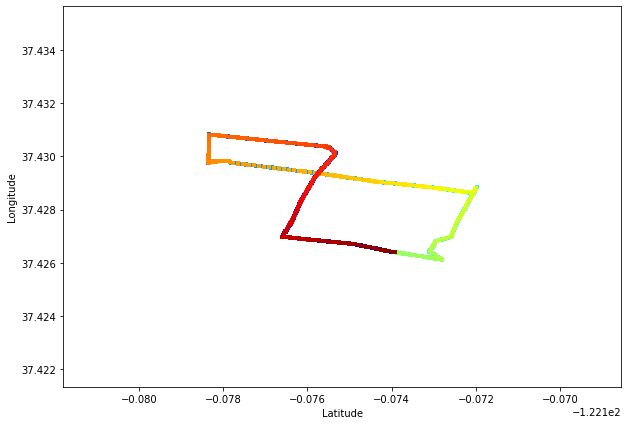

In [5]:
DAS_1_dir_example = os.getcwd()

csvtmp = read_csv(os.path.join(DAS_1_dir_example,'Stanford-1-Campus-geometry.csv'))
lon1 = np.asarray([float(csvtmp[i][2]) for i in range(1,len(csvtmp))])
lat1 = np.asarray([float(csvtmp[i][3]) for i in range(1,len(csvtmp))])
ch_order = np.arange(len(lon1))

plt.figure(figsize=[10,7])
plt.scatter(lon1, lat1, marker='s', c=ch_order, cmap='jet', s=10)

plt.xlabel('Latitude')
plt.ylabel('Longitude')
plt.show()

### Example of importing DAS-1 SEG-Y data

In [6]:
DAS_1_filename = os.path.join(DAS_1_dir_example,'Data/2016/09/02/cbt_processed_20160902_173853.923+0000.sgy')

DAS1_data, nch, nt, dt, data_stats = import_segy_data(DAS_1_filename)
dx = 8.16

DAS1_data = DAS_preprocessing(DAS1_data, dt, fl=0.1, fh=20)

print('nch, nt = %i, %i'%(nch, nt)) 
print('Sampling rate : %.2f Hz'%(1./dt))
print('Channel spacing : %.2f m'%(dx))

nch, nt = 626, 3000
Sampling rate : 50.00 Hz
Channel spacing : 8.16 m


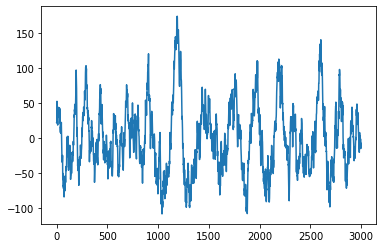

In [7]:
plt.plot(DAS1_data[0])

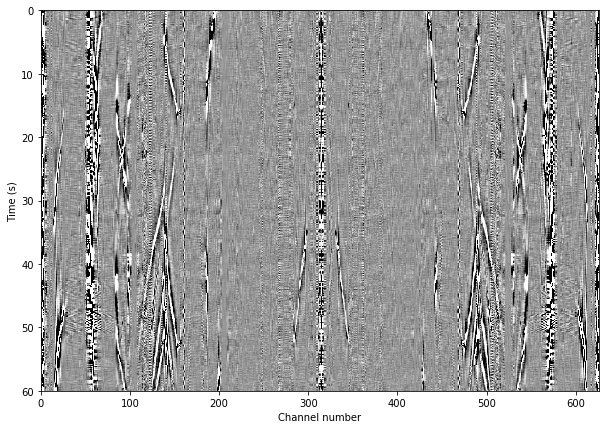

In [8]:
plt.figure(figsize=[10,7])

clim = DAS1_data.std() / 5e3
extent = [0, nch, nt*dt, 0]
plt.imshow(DAS1_data.T, vmin=-clim, vmax=clim, cmap='Greys', aspect='auto', origin='upper', extent=extent)

plt.xlabel('Channel number')
plt.ylabel('Time (s)')

plt.show()

### Example of reading seismometer data accompanying the DAS-1 recording

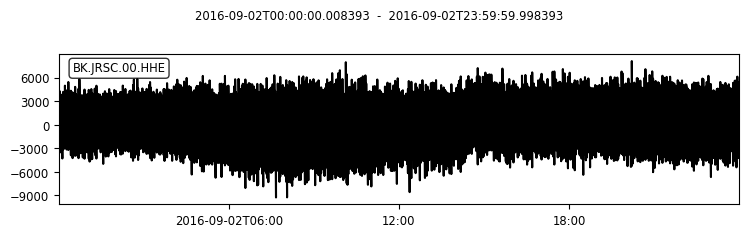

In [9]:
JRSC_st = read(os.path.join(DAS_1_dir_example,'Data/BK_JRSC/BK.JRSC.00.HHE__20160902T000000Z__20160903T000000Z.mseed'))
JRSC_st[0].plot()
plt.show()

# 1 Day Data

### Quarry Blast Data DAS recordings on 12 October 2016 18:30:16.9 UTC

<img src="quarry.png" alt="" />

/ |#                                                  | 0 Elapsed Time: 0:00:00

         network: 
         station: 
        location: 
         channel: 
       starttime: 2016-10-12T18:30:20.000000Z
         endtime: 2016-10-12T18:31:19.980000Z
   sampling_rate: 50.0
           delta: 0.02
            npts: 3000
           calib: 1.0
            segy: AttribDict({'trace_header': LazyTraceHeaderAttribDict({'unpacked_header': b'\x00\x00\x00\x01\x00\x00\x00\x01<T\xaf\xec\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xf2~\xa1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\x9c\xff\x9c\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x928[\x01\xadm8\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\xb8N \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\xe0\x01\x1e\x00\x12\x00\x1e\x00\x14\x00\x04\x

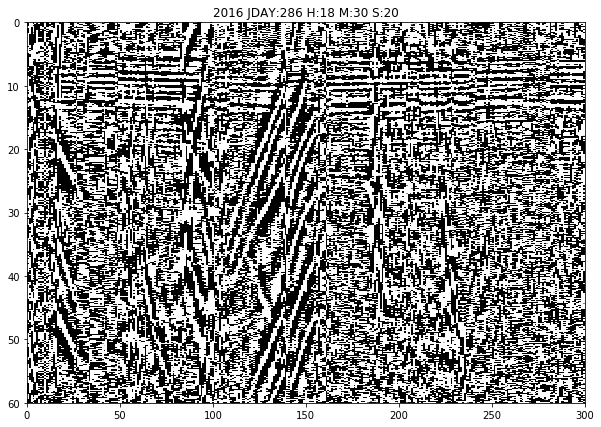

| |    #                                              | 0 Elapsed Time: 0:00:00


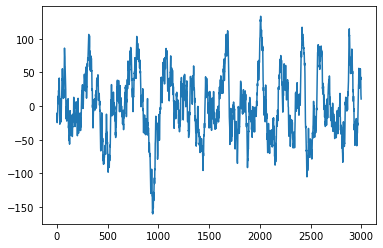

In [19]:
# segys = sorted(glob.glob(os.path.join(DAS_1_dir_example,'Data/2016/10/12/cbt_processed_20161012_1829*.sgy')))
segys = sorted(glob.glob(os.path.join(DAS_1_dir_example,'Data/2016/10/12/cbt_processed_20161012_183*.sgy')))

for i, segy in progressbar.progressbar(enumerate(segys[:1])):
    DAS1_data, nch, nt, dt, data_stats = import_segy_data(segy)
    dx = 8.16
    DAS1_data = DAS_preprocessing(DAS1_data, dt, fl=0.1, fh=20)
    if i == 0:
        print(data_stats)
    
    plt.figure(figsize=[10,7])
    clim = DAS1_data.std() / 5e3
    extent = [0, 300, nt*dt, 0]
    plt.imshow(DAS1_data[:299].T, vmin=-clim, vmax=clim, cmap='Greys', aspect='auto', origin='upper', extent=extent)
    time = str(data_stats.segy.trace_header.year_data_recorded) + ' JDAY:' \
    + str(data_stats.segy.trace_header.day_of_year) + ' H:' \
    + str(data_stats.segy.trace_header.hour_of_day) + ' M:' \
    + str(data_stats.segy.trace_header.minute_of_hour) + ' S:' \
    + str(data_stats.segy.trace_header.second_of_minute)
    plt.title(time)
#     plt.xlabel('Channel number')
#     plt.ylabel('Time (s)')
    plt.show()
    plt.close('all')
    
    plt.plot(DAS1_data[0])

In [11]:
segys

['/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183020.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183120.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183220.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183320.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183420.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183520.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183620.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183720.535+0000.sgy',
 '/media/dertuncay/Elements3/DAS/PubDAS/Standford1/Data/2016/10/12/cbt_processed_20161012_183820.535+000